# Prototype for Hanoi (2)

In [1]:
import numpy as np
import math
from scipy.spatial.distance import squareform
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import seaborn as sns
from IPython.display import HTML

In [2]:
class MutEffect:
    def __init__(self, mean: np.ndarray, var: np.ndarray, cov: np.ndarray):
        self.mean = mean
        self.var = var
        self.cov = cov
        self.n = self.mean.shape[0]
        self.L = self.mean.shape[1]
        for arr in [self.mean, self.var, self.cov]:
            if arr.ndim != 2:
                raise ValueError("mean, var, and cov should be 2D")
        if self.n != self.var.shape[0]:
            raise ValueError("mean and var should have the same number of rows (n)")
        if self.L != self.var.shape[1]:
            raise ValueError("mean and var should have the same number of columns (L)")
        if self.cov.shape[0] != math.comb(self.n, 2):
            raise ValueError("The number of rows of cov should be n choose 2")
    def show(self):
        print(f"Number of traits n:\n{self.n}")
        print(f"Number of trait pairs:\n{self.cov.shape[0]}")
        print(f"Number of loci L:\n{self.L}")
        print(f"Mutation effect of mean:\n{self.mean}")
        print(f"Mutation effect of variance:\n{self.var}")
        print(f"Mutation effect of covariance:\n{self.cov}")

In [3]:
class BreedVal:
    def __init__(self, mean: np.ndarray, var: np.ndarray, cov: np.ndarray):
        self.mean = mean
        self.var = var 
        self.cov = cov 
        self.N = mean.shape[0]
        self.n = mean.shape[1]
        self.varcov = [cov_mtx(var = self.var[i], cov = self.cov[i]) for i in range(self.N)]
        for arr in (self.var, self.cov):
            if arr.ndim != 2:
                raise ValueError("mean, var, and cov must be 2D arrays.")
        Ns = [self.var.shape[0], self.cov.shape[0]]
        if not all(N == self.N for N in Ns):
            raise ValueError("mean, var, and cov must have the same number of rows (N)")
        if self.n != var.shape[1]:
            raise ValueError("mean and var must have the same number of columns (n)")
        if math.comb(self.n, 2) != self.cov.shape[1]:
            raise ValueError("The number of columns of cov should match the number of column of mean choose 2")
    def show(self):
        print(f"Number of traits:\n {self.n}")
        print(f"Number of trait pairs:\n {math.comb(self.n, 2)}")
        print(f"Number of individuals:\n {self.N}")
        print(f"Breeding value of mean:\n {self.mean}")
        print(f"Breeding value of variance:\n {self.var}")
        print(f"Breeding value of covariance:\n {self.cov}")
        print(f"Covariance matrices of breeding values :\n {self.varcov}")

In [4]:
class Generation:
    def __init__(self, genotype: np.ndarray, 
                 genotype_next: np.ndarray,
                 breed_val: BreedVal, 
                 phenotype: np.ndarray, 
                 fitness: np.ndarray,
                 n_offspring: np.ndarray
                ):
        self.genotype = genotype
        self.genotype_next = genotype_next
        self.breed_val = breed_val
        self.phenotype = phenotype
        self.fitness = fitness
        self.n_offspring = n_offspring
    def allele_freqs(self):
        return (self.genotype.mean(axis=1)/2)[np.newaxis, :]
    def allele_freqs_next(self):
        return (self.genotype_next.mean(axis=1)/2)[np.newaxis, :]


In [5]:
class Generations(Generation):
    def __init__(self, *args, n_gen, **kwargs):
        super().__init__(*args, **kwargs)
        self.n_gen = n_gen
    def allele_freqs(self):
        #return np.array([genotype.mean(axis=1)/2 for genotype in generations.genotype_next])
        return np.append((self.genotype[0].mean(axis=1)/2)[np.newaxis, :], np.array([genotype.mean(axis=1)/2 for genotype in self.genotype_next]), axis = 0)
    def generation(self, t):
        return Generation(genotype = self.genotype[t], 
                          breed_val = self.breed_val[t], 
                          fitness = self.fitness[t], 
                          genotype_next = self.genotype_next[t], 
                          n_offspring = self.n_offspring[t], 
                          phenotype = self.phenotype[t]
                         )
    def allele_freq_last(self):
        return self.generation(-1).allele_freqs_next()
    def allele_freq_first(self):
        return self.generation(0).allele_freqs()

    def show(self):
        print(f"Number of traits:\n {self.phenotype.shape[2]}")
        print(f"Number of individuals:\n {self.phenotype.shape[1]}")
        print(f"Number of generations:\n {self.phenotype.shape[0]}")

In [5]:
def cov_mtx(var, cov):
    return squareform(cov) + np.diag(var)

In [6]:
def comp_breed_val(mut_effect: MutEffect, genotype: np.ndarray):
    A_m = (1/2 * mut_effect.mean @ genotype).transpose()
    A_v = (1/2 * mut_effect.var @ genotype).transpose()
    A_c = (1/2 * mut_effect.cov @ genotype).transpose()
    return BreedVal(mean = A_m, var = A_v, cov = A_c)

In [30]:
G_cur.shape

(1400, 100)

In [34]:
bv = comp_breed_val(mut_effect=M, genotype=np.zeros((1400,1)))


In [35]:
bv.show()

Number of traits:
 2
Number of trait pairs:
 1
Number of individuals:
 1
Breeding value of mean:
 [[0. 0.]]
Breeding value of variance:
 [[0. 0.]]
Breeding value of covariance:
 [[0.]]
Covariance matrices of breeding values :
 [array([[0., 0.],
       [0., 0.]])]


In [7]:
def sim_pheno(breed_val: BreedVal, mean_0, cov_0):
    z = np.zeros((breed_val.N, breed_val.n))
    for i in range(breed_val.N):
        z[i] = np.random.multivariate_normal(mean = mean_0 + breed_val.mean[i], cov = cov_0 + breed_val.varcov[i])
    return z

In [8]:
def fit_neutral(z):
    return np.repeat(np.array(1.0), len(z))

In [9]:
def fit_gaus(sigma, z_opt, z):
    return np.array([np.exp(-(np.linalg.norm(z_i - z_opt))**2/(2 * sigma**2)) for z_i in z])

In [10]:
def fit_multimodal(sigma, p, z_opt, z):
    w = np.zeros(len(z))
    # Loop over peaks
    for i in range(len(sigma)):
        w += p[i] * fit_gaus(sigma[i], z_opt, z)
    return w

In [11]:
def fit_step(boxes, z):
    """
    z:     (N, n) array of n-dimensional phenotypes of N individuals.
    boxes: (m, 2, n) array of m boxes, where boxes[i, 0] = lower bounds, boxes[i, 1] = upper bounds. Fitness of phenotype within boxes is 1.
    Returns: (N,) array of 0 or 1
    """
    return np.any(
        np.all((z[:, None, :] >= boxes[:, 0, :]) & (z[:, None, :] <= boxes[:, 1, :]), axis=2),
        axis=1
    ).astype(float)
    #return np.astype(np.any(np.all((z[:, None, :] >= boxes[:, 0, :]) & (z[:, None, :] <= boxes[:, 1, :]), axis=2), axis =1), float)

In [12]:
z = np.array([[0], [1], [2]])
boxes = np.array([
    [[0], [math.inf]],  # includes [0,0] and [1,1]
])


In [15]:
def sim_reproduction(popsize, genotype, fitness ):
    # number of offspring per genotype of each genotype
    if fitness.sum() == 0:
        n_loci = genotype.shape[0]
        genotype_next = np.full((n_loci, popsize), np.nan)
        n_offspring = np.zeros(popsize, dtype = int)
        #raise RuntimeError("Fitness of all individuals is 0")
        return genotype_next, n_offspring
    else:
        n_offspring = np.random.multinomial(n = 2 * popsize, pvals = fitness/sum(fitness))
        # index of 2N parents
        sam = np.repeat(range(popsize), n_offspring)
        np.random.shuffle(sam)
        # Make genotype of next parents randomly take one haplotype per locus per parent
        genotype_next = np.array([np.sum(np.random.binomial(1, genotype[:, sam[[2 * i, 2 * i + 1]]]/2), axis = 1) for i in range(popsize)]).transpose()
        return genotype_next, n_offspring

In [16]:
def sim_mutation(genotype, mut_rate):
    # Compute transition matrix
    transition_matrix = np.array([[(1 - mut_rate)**2, 2 * mut_rate * (1 - mut_rate), mut_rate**2],
                                  [mut_rate * (1 - mut_rate), (1 - mut_rate)**2 + mut_rate**2, mut_rate * (1 - mut_rate)],
                                  [mut_rate**2, 2 * mut_rate * (1 - mut_rate), (1 - mut_rate)**2]])

    # Count the number of entries in the genotype matrix for each of the 3 genotypes
    n_sites_genotype = np.array([(genotype == i).sum() for i in range(3)])
    # Make mapping of genotype to a set of index of the genotype matrix
    idx_sites_genotype = {i : np.where(genotype == i) for i in range(3)}
    # Make realised transition count matrix, where (i, j) has number of sites with genotype i which mutate into j
    n_sites_muts = np.array([np.random.multinomial(n_sites_genotype[i], transition_matrix[i]) for i in range(3)])
    # Introduce mutations
    for i in range(3):
        geno_muts = np.repeat([0,1,2], n_sites_muts[i])
        np.random.shuffle(geno_muts)
        genotype[idx_sites_genotype[i]] = geno_muts
    # Return mutated genotype matrix
    return genotype

In [17]:
def sim_generation(mut_effect, genotype, mut_rate, fit_func, mean_0, cov_0, **kwargs):
    popsize = genotype.shape[1]
    
    # Breeding value
    A = comp_breed_val(mut_effect=mut_effect, genotype=genotype)
    
    # Phenotype
    z = sim_pheno(breed_val=A, mean_0=mean_0, cov_0 = cov_0)
    
    # Phenotype to fitness
    if fit_func == "fit_gaus":
        w = fit_gaus(z=z, **kwargs)
    if fit_func == "fit_multimodal":
        w = fit_multimodal(sigma=sigma, p=kwargs.get('p'), z_opt=z_opt, z=z)
    if fit_func == "fit_neutral":
        w = fit_neutral(z=z)
    if fit_func == "fit_step":
        ranges = kwargs.get('boxes')
        w = fit_step(z=z, boxes=ranges)
    
    # Reproduction
    genotype_next, n_offspring = sim_reproduction(popsize=popsize, genotype=genotype, fitness=w)
    #if n_offspring.sum() == 0:
    #    raise RuntimeError("No individuals survived")
    genotype_next = sim_mutation(genotype=genotype_next, mut_rate=mut_rate) # This still returns nans if it is nans

    return Generation(genotype = genotype, 
                      genotype_next = genotype_next,
                      breed_val = A, 
                      phenotype = z, 
                      fitness = w,
                      n_offspring = n_offspring
                     )

In [20]:
def sim_generations(n_gen, mut_effect, genotype, mut_rate, fit_func, mean_0, cov_0, **kwargs):
    generations_list = []
    genotype_cur = genotype
    if n_gen == 0:
        i = 0
        while not (np.all(np.isin(genotype_cur, [0,2])) or np.all(np.isnan(genotype_cur))):
            generations_list.append(sim_generation(mut_effect = mut_effect, 
                                                   genotype = genotype_cur, 
                                                   mut_rate = mut_rate, 
                                                   fit_func = fit_func, 
                                                   mean_0 = mean_0,
                                                   cov_0 = cov_0,
                                                   **kwargs))
            genotype_cur = generations_list[-1].genotype_next
            i+=1
    else:
        for i in range(n_gen):
            while not np.all(np.isnan(genotype_cur)):
                generations_list.append(sim_generation(mut_effect = mut_effect, 
                                                       genotype = genotype_cur, 
                                                       mut_rate = mut_rate, 
                                                       fit_func = fit_func, 
                                                       mean_0 = mean_0,
                                                       cov_0 = cov_0,
                                                       **kwargs))
                genotype_cur = generations_list[-1].genotype_next
    generations = Generations(genotype = np.array([generation.genotype for generation in generations_list]), 
                              genotype_next = np.array([generation.genotype_next for generation in generations_list]), 
                              breed_val = np.array([generation.breed_val for generation in generations_list]),
                              phenotype = np.array([generation.phenotype for generation in generations_list]),
                              fitness = np.array([generation.fitness for generation in generations_list]),
                              n_offspring = np.array([generation.n_offspring for generation in generations_list]),
                              n_gen = i
                             )
    return generations

# Check a scenario of many loci, 2 traits, only mean effects.

In [21]:
L = 1400
N = 100
n = 2

In [22]:
M_m = np.zeros((n, L))
M_v = np.zeros((n, L))
M_c = np.zeros((math.comb(n, 2), L))

In [23]:
M = MutEffect(mean = M_m, var = M_v, cov = M_c)

In [24]:
M.mean[0, 0:300] = 1.0
M.mean[1, 300:600] = 1.0

In [25]:
G_cur = np.zeros((L, N))

In [26]:
G_cur

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [27]:
G_cur.flat[np.random.choice(G_cur.size, 10000, replace = False)] = 1

In [28]:
G_cur.size

140000

In [162]:
G_cur

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [163]:
generations = sim_generations(n_gen =0, 
                              mut_effect = M, 
                              genotype = G_cur, 
                              mut_rate = 0,
                              fit_func = "fit_gaus", 
                              sigma = 10, 
                              z_opt = [100, 50],
                              mean_0 = np.array([0,0]),
                              cov_0 = np.array([[1, 0],
                                                [0, 1]])
                             )

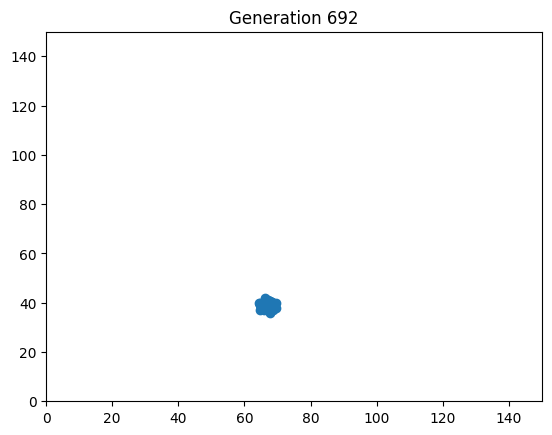

In [165]:
# Assuming generations.phenotype has shape (t, N, 2)
data = generations.phenotype
t = data.shape[0]

fig, ax = plt.subplots()
scat = ax.scatter([], [])
ax.set_xlim(0, 150)
ax.set_ylim(0, 150)

def init():
    scat.set_offsets(np.empty((0, 2)))
    return scat,


def update(frame):
    xy = data[frame]  # shape (N, 2)
    scat.set_offsets(xy)
    ax.set_title(f"Generation {frame}")
    return scat,

ani = FuncAnimation(fig, update, frames=t, init_func=init, blit=True)

HTML(ani.to_jshtml())


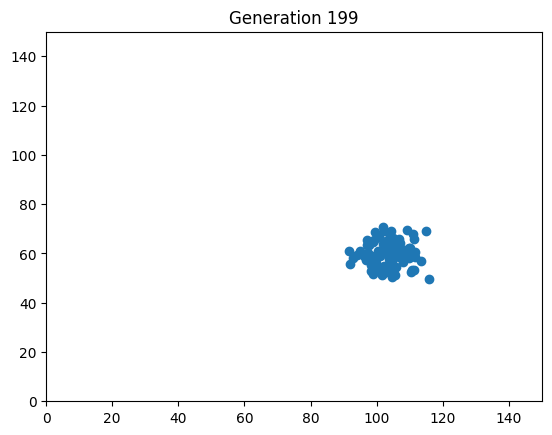

In [74]:
# Assuming generations.phenotype has shape (t, N, 2)
data = generations.phenotype
t = data.shape[0]

fig, ax = plt.subplots()
scat = ax.scatter([], [])
ax.set_xlim(0, 150)
ax.set_ylim(0, 150)

def init():
    scat.set_offsets(np.empty((0, 2)))
    return scat,


def update(frame):
    xy = data[frame]  # shape (N, 2)
    scat.set_offsets(xy)
    ax.set_title(f"Generation {frame}")
    return scat,

ani = FuncAnimation(fig, update, frames=t, init_func=init, blit=True)

HTML(ani.to_jshtml())

# Many loci, one trait, only mean effect (to explore visualisation)

In [75]:
L = 1400
N = 100
n = 1

In [76]:
M_m = np.zeros((n, L))
M_v = np.zeros((n, L))
M_c = np.zeros((math.comb(n, 2), L))

In [77]:
M = MutEffect(mean = M_m, var = M_v, cov = M_c)

In [78]:
M.mean[0, 0:300] = 1.0

In [79]:
G_cur = np.zeros((L, N))

In [80]:
generations_0 = sim_generations(n_gen =100, 
                              mut_effect = M, 
                              genotype = G_cur, 
                              mut_rate = 0.001, 
                              fit_func = "fit_gaus", 
                              sigma = 10, 
                              z_opt = np.array([[0]]),
                              mean_0 = np.array([0]),
                              cov_0 = np.array([[1]])
                             )

generations_1 = sim_generations(n_gen =100, 
                              mut_effect = M, 
                              genotype = generations_0.genotype[-1], 
                              mut_rate = 0.001, 
                              fit_func = "fit_gaus", 
                              sigma = 10, 
                              z_opt = np.array([[50]]),
                              mean_0 = np.array([0]),
                              cov_0 = np.array([[1]])
                             )
generations_2 = sim_generations(n_gen =100, 
                              mut_effect = M, 
                              genotype = generations_1.genotype[-1], 
                              mut_rate = 0.001, 
                              fit_func = "fit_gaus", 
                              sigma = 10, 
                              z_opt = np.array([[10]]),
                              mean_0 = np.array([0]),
                              cov_0 = np.array([[1]])
                             )


In [81]:
data = np.concatenate([generations_0.phenotype, generations_1.phenotype, generations_2.phenotype], axis = 0)

In [87]:
data.shape

(300, 100, 1)

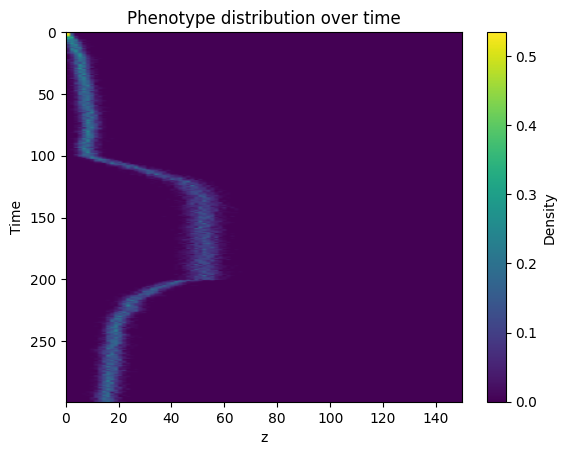

In [86]:
# Histogram bins along z-axis
t = data.shape[0]
z_bins = np.linspace(0, 150, 100)
z_centers = 0.5 * (z_bins[:-1] + z_bins[1:])

# Compute density for each timepoint
density = np.zeros((t, len(z_bins) - 1))  # shape: (time, z)
for i in range(t):
    values = data[i, :, 0]
    hist, _ = np.histogram(values, bins=z_bins, density=True)
    density[i, :] = hist

# Plot heatmap
plt.imshow(
    density,
    aspect='auto',
    extent=[z_bins[0], z_bins[-1], t - 1, 0],
    cmap='viridis'
)
plt.xlabel("z")
plt.ylabel("Time")
plt.colorbar(label="Density")
plt.title("Phenotype distribution over time")
plt.show()


# One locus with noise

In [27]:
L = 1
N = 100
n = 1

In [28]:
M_m = np.zeros((n, L))
M_v = np.zeros((n, L))
M_c = np.zeros((math.comb(n, 2), L))

In [24]:
M_v[0][0] = 10
M_m[0][0] = -1

In [25]:
M = MutEffect(mean = M_m, var = M_v, cov = M_c)

In [26]:
M.mean

array([[-1.]])

In [508]:
M.show()

Number of traits n:
1
Number of trait pairs:
0
Number of loci L:
1
Mutation effect of mean:
[[-1.]]
Mutation effect of variance:
[[10.]]
Mutation effect of covariance:
[]


In [509]:
G_cur = np.zeros((L, N))

In [510]:
G_cur

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.]])

In [511]:
G_cur[0][0:10] = 1

In [551]:
generations = sim_generations(n_gen =0, 
                              mut_effect = M, 
                              genotype = G_cur, 
                              mut_rate = 0, 
                              fit_func = "fit_step", 
                              boxes = np.array([[[1], [math.inf]]]),
                              mean_0 = np.array([0]),
                              cov_0 = np.array([0.1])
                             )

In [552]:
generations.allele_freqs()

array([[0.05 ],
       [0.515],
       [0.665],
       [0.76 ],
       [0.76 ],
       [0.865],
       [0.84 ],
       [0.885],
       [0.825],
       [0.865],
       [0.875],
       [0.88 ],
       [0.875],
       [0.91 ],
       [0.88 ],
       [0.935],
       [1.   ]])

In [535]:
generations.allele_freq_first()

array([[0.05]])

In [554]:
generations.allele_freq_last()

array([[1.]])

In [555]:
generations.n_gen

16

In [556]:
generations.genotype

array([[[1., 1., 1., ..., 0., 0., 0.]],

       [[2., 2., 1., ..., 0., 1., 1.]],

       [[0., 2., 2., ..., 2., 2., 1.]],

       ...,

       [[2., 1., 2., ..., 1., 2., 2.]],

       [[1., 1., 2., ..., 1., 2., 2.]],

       [[1., 2., 2., ..., 2., 2., 2.]]])

In [ ]:
generation.

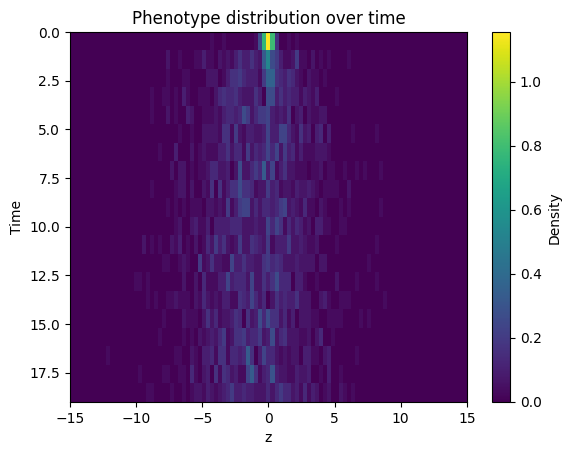

In [502]:
# Histogram bins along z-axis
data = generations.phenotype
t = data.shape[0]
z_bins = np.linspace(-15, 15, 100)
z_centers = 0.5 * (z_bins[:-1] + z_bins[1:])

# Compute density for each timepoint
density = np.zeros((t, len(z_bins) - 1))  # shape: (time, z)
for i in range(t):
    values = data[i, :, 0]
    hist, _ = np.histogram(values, bins=z_bins, density=True)
    density[i, :] = hist

# Plot heatmap
plt.imshow(
    density,
    aspect='auto',
    extent=[z_bins[0], z_bins[-1], t - 1, 0],
    cmap='viridis'
)
plt.xlabel("z")
plt.ylabel("Time")
plt.colorbar(label="Density")
plt.title("Phenotype distribution over time")
plt.show()


In [416]:
generations.n_offspring

array([[  0,   0, 102, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,  11,   0,   0],
       ...,
       [  0,   0,   0, ...,   9,   0,   0],
       [  0,   7,   2, ...,   0,   0,   0],
       [  2,   0,  12, ...,   0,   7,   0]])

In [417]:
import time

results = []
start = time.time()
for i in range(100):
    results.append(sim_generations(n_gen =0, 
                                  mut_effect = M, 
                                  genotype = G_cur, 
                                  mut_rate = 0, 
                                  fit_func = "fit_neutral", 
                                  boxes = np.array([[[1], [math.inf]]]),
                                  mean_0 = np.array([0]),
                                  cov_0 = np.array([0.1])
                                 ))
end = time.time()
print("Elapsed:", end - start, "seconds")

Elapsed: 31.388960599899292 seconds


In [426]:
results[6].genotype_next[-1].mean()

np.float64(0.0)

In [282]:
G_cur.shape

(1, 100)

In [283]:
np.full((L, N), None)

array([[None, None, None, None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None,
        None]], dtype=object)

In [286]:
generations.n_offspring[0].shape

(100,)

In [292]:
np.zeros(N, dtype = int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

dtype('int64')

In [427]:
generations.genotype[-1].

array([[2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 1.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 2., 1., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 2., 2.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.]])

In [628]:
sim = sim_generations(n_gen =0, 
                mut_effect = M, 
                genotype = G_cur, 
                mut_rate = 0, 
                fit_func = "fit_step", 
                boxes = np.array([[[100], [math.inf]]]),
                mean_0 = np.array([0]),
                cov_0 = np.array([0.1])
               )

In [629]:
sim.allele_freqs()

array([[0.05],
       [ nan]])

In [630]:
sim.allele_freq_last()

array([[nan]])

In [635]:
np.array([sim.n_gen, sim.allele_freq_last()[0,0]])

array([ 1., nan])

In [641]:
res = []
for i in range(100):
    sim = sim_generations(n_gen =0, 
                                  mut_effect = M, 
                                  genotype = G_cur, 
                                  mut_rate = 0, 
                                  fit_func = "fit_step", 
                                  boxes = np.array([[[1], [math.inf]]]),
                                  mean_0 = np.array([0]),
                                  cov_0 = np.array([0.1])
                                 )
    res.append([sim.n_gen, sim.allele_freq_last()[0,0]])

In [642]:
res

[[9, np.float64(1.0)],
 [16, np.float64(1.0)],
 [10, np.float64(1.0)],
 [16, np.float64(1.0)],
 [15, np.float64(1.0)],
 [9, np.float64(1.0)],
 [19, np.float64(1.0)],
 [19, np.float64(1.0)],
 [15, np.float64(1.0)],
 [7, np.float64(1.0)],
 [16, np.float64(1.0)],
 [12, np.float64(1.0)],
 [7, np.float64(1.0)],
 [9, np.float64(1.0)],
 [29, np.float64(1.0)],
 [12, np.float64(1.0)],
 [16, np.float64(1.0)],
 [17, np.float64(1.0)],
 [10, np.float64(1.0)],
 [13, np.float64(1.0)],
 [1, np.float64(nan)],
 [32, np.float64(1.0)],
 [18, np.float64(1.0)],
 [29, np.float64(1.0)],
 [1, np.float64(nan)],
 [18, np.float64(1.0)],
 [43, np.float64(1.0)],
 [7, np.float64(1.0)],
 [8, np.float64(1.0)],
 [23, np.float64(1.0)],
 [16, np.float64(1.0)],
 [25, np.float64(1.0)],
 [22, np.float64(1.0)],
 [9, np.float64(1.0)],
 [9, np.float64(1.0)],
 [12, np.float64(1.0)],
 [15, np.float64(1.0)],
 [26, np.float64(1.0)],
 [11, np.float64(1.0)],
 [22, np.float64(1.0)],
 [14, np.float64(1.0)],
 [22, np.float64(1.0)],
 [1